In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

In [2]:
torch.cuda.is_available()

True

In [3]:
cuda = torch.device("cuda:0")

In [8]:
! git clone https://github.com/kristerseiya/SinGAN_Implementation.git
! cd /content/SinGAN_Implementation && git pull origin master

fatal: destination path 'SinGAN_Implementation' already exists and is not an empty directory.
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 7 (delta 3), reused 7 (delta 3), pack-reused 0
Unpacking objects: 100% (7/7), done.
From https://github.com/kristerseiya/SinGAN_Implementation
 * branch            master     -> FETCH_HEAD
   3154d68..abbf23c  master     -> origin/master
Updating 3154d68..abbf23c
Fast-forward
 .DS_Store                   | Bin 6148 -> 6148 bytes
 images/everywhere.png       | Bin 0 -> 273992 bytes
 images/everywhere_small.png | Bin 0 -> 19144 bytes
 images/fetchimage.webp      | Bin 0 -> 32444 bytes
 4 files changed, 0 insertions(+), 0 deletions(-)
 create mode 100644 images/everywhere.png
 create mode 100644 images/everywhere_small.png
 create mode 100644 images/fetchimage.webp


In [5]:
from SinGAN_Implementation.train import *
from SinGAN_Implementation.utils import *
from SinGAN_Implementation.models import *

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

# Data Preprocessing

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 3-nature-wallpaper-mountain.jpg to 3-nature-wallpaper-mountain.jpg


## Nature


(1600, 1008)


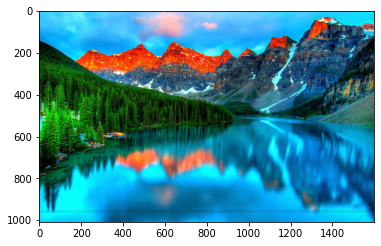

In [ ]:
img = load_image("SinGAN_Implementation/images/3-nature-wallpaper-mountain.jpg")
print(img.size)
plt.imshow(img)
plt.show()

In [ ]:
scaled_img_list = create_scaled_images(img,0.75,12,250)
scaled_img_list

[<PIL.Image.Image image mode=RGB size=19x12 at 0x7FB6D004A7F0>,
 <PIL.Image.Image image mode=RGB size=25x16 at 0x7FB6D004A2E8>,
 <PIL.Image.Image image mode=RGB size=33x21 at 0x7FB6D004A5C0>,
 <PIL.Image.Image image mode=RGB size=44x28 at 0x7FB6D004A978>,
 <PIL.Image.Image image mode=RGB size=58x37 at 0x7FB6D0047400>,
 <PIL.Image.Image image mode=RGB size=77x49 at 0x7FB6D0047B00>,
 <PIL.Image.Image image mode=RGB size=102x65 at 0x7FB6D0047A20>,
 <PIL.Image.Image image mode=RGB size=136x86 at 0x7FB6D0047630>,
 <PIL.Image.Image image mode=RGB size=181x114 at 0x7FB6D00478D0>,
 <PIL.Image.Image image mode=RGB size=241x152 at 0x7FB6D00477B8>]

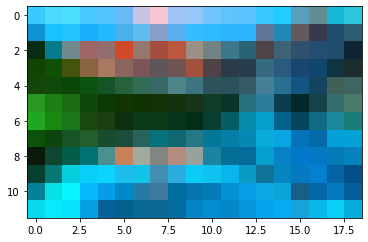

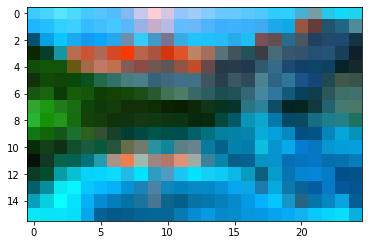

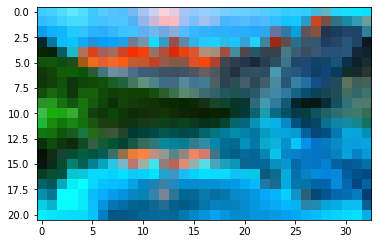

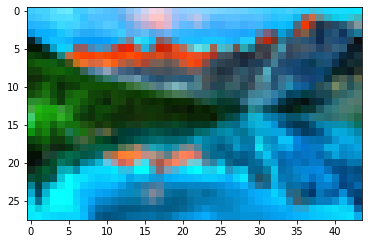

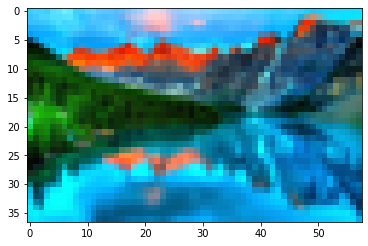

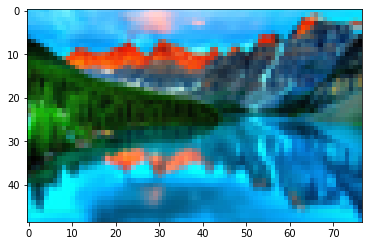

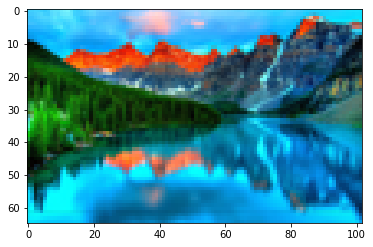

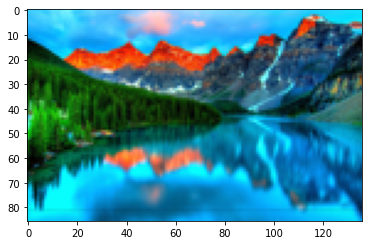

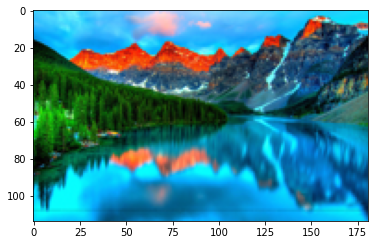

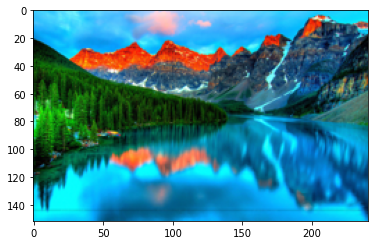

In [ ]:
for img in scaled_img_list:
  plt.imshow(img)
  plt.show()

In [ ]:
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)

## Ice Mountain

(2560, 1600)


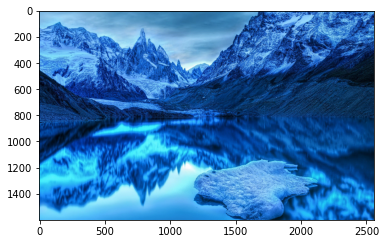

10


In [ ]:
img = load_image("SinGAN_Implementation/images/icemountain.jpg")
print(img.size)
plt.imshow(img)
plt.show()
scaled_img_list = create_scaled_images(img,0.75,12,250)
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)
print(len(scaled_img_list))

## Water


(1000, 749)


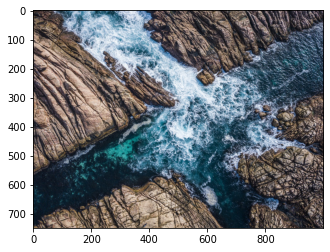

10


In [ ]:
img = load_image("water.jpeg")
print(img.size)
plt.imshow(img)
plt.show()
scaled_img_list = create_scaled_images(img,0.75,15,300)
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)
print(len(scaled_img_list))

## Ocean

(2000, 1308)


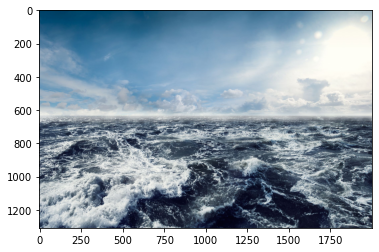

10


In [ ]:
img = load_image("SinGAN_Implementation/images/ocean.jpg")
print(img.size)
plt.imshow(img)
plt.show()
scaled_img_list = create_scaled_images(img,0.75,12,300)
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)
print(len(scaled_img_list))

## Another Mountain

(1600, 1066)


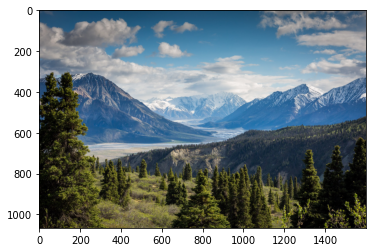

10


In [49]:
img = load_image("vs.jpeg")
print(img.size)
plt.imshow(img)
plt.show()
scaled_img_list = create_scaled_images(img,0.75,12,250)
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)
print(len(scaled_img_list))

## Everywhere

(700, 394)


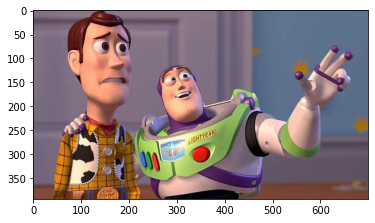

10


In [55]:
img = load_image("SinGAN_Implementation/images/everywhere.png")
print(img.size)
plt.imshow(img)
plt.show()
scaled_img_list = create_scaled_images(img,0.75,12,250,False)
scaled_img_tensor_list = convert_images2tensors(scaled_img_list,device=cuda)
print(len(scaled_img_list))

In [34]:
scaled_img_list

[<PIL.Image.Image image mode=RGB size=20x12 at 0x7F9DE6B06B00>,
 <PIL.Image.Image image mode=RGB size=26x15 at 0x7F9DE6B06A58>,
 <PIL.Image.Image image mode=RGB size=34x20 at 0x7F9DE6B06978>,
 <PIL.Image.Image image mode=RGB size=45x26 at 0x7F9DE6B06048>,
 <PIL.Image.Image image mode=RGB size=60x34 at 0x7F9DE6BD3438>,
 <PIL.Image.Image image mode=RGB size=79x45 at 0x7F9DE6BC7828>,
 <PIL.Image.Image image mode=RGB size=105x60 at 0x7F9DE6BEA470>,
 <PIL.Image.Image image mode=RGB size=140x79 at 0x7F9DE6C741D0>]

# Training 

## Nature

In [ ]:
netG_chain = SinGAN(0.75)
netD_list = []

In [ ]:
num_scales = len(scaled_img_list)
num_channel = 8

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,num_channel,num_channel,num_channel,3],[3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,num_channel,num_channel,num_channel,1],[3,3,3,3])
  # netD = Discriminator(img.size(),[3,num_channel,num_channel,num_channel,1],\
  #                      [4,4,4,7],[1,1,1,1],n_dense_layer=0)
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        netG_chain,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=10,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  netG_chain.append(netG,z_std,fixed_z)

  num_channel = (int) (num_channel / 0.75)
  

Output hidden; open in https://colab.research.google.com to view.

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


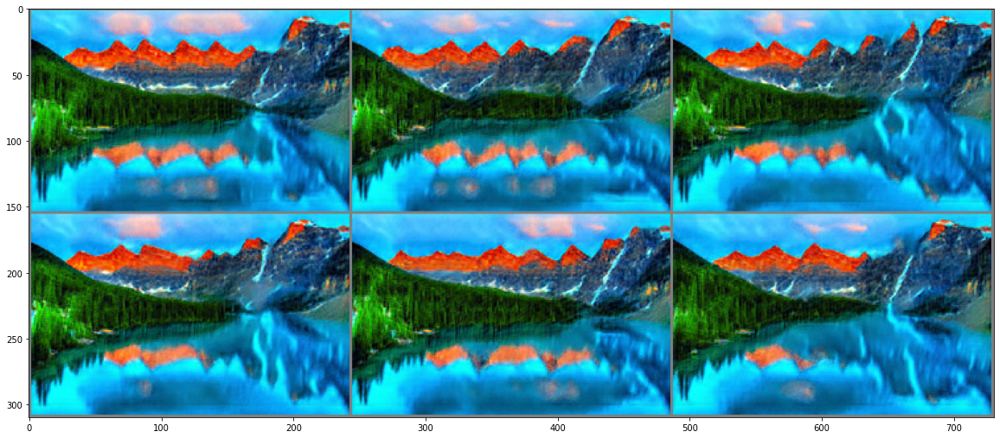

In [ ]:
x = netG_chain.sample(n_sample=6)
plt.figure(figsize=(20,10))
show_tensor_image(x,3)

In [ ]:
move_singan(netG_chain, torch.device('cpu'))
save_singan(netG_chain,'/content/singan_nature.pth')

## Ice Mountain

In [ ]:
netG_chain = SinGAN(0.75)
netD_list = []

In [ ]:
num_scales = len(scaled_img_list)
num_channel = 8

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,num_channel,num_channel,num_channel,3],[3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,num_channel,num_channel,num_channel,1],[3,3,3,3])
  # netD = Discriminator(img.size(),[3,num_channel,num_channel,num_channel,1],\
  #                      [4,4,4,7],[1,1,1,1],n_dense_layer=0)
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        netG_chain,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=10,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  netG_chain.append(netG,z_std,fixed_z)

  num_channel = (int) (num_channel / 0.75)
  

Output hidden; open in https://colab.research.google.com to view.

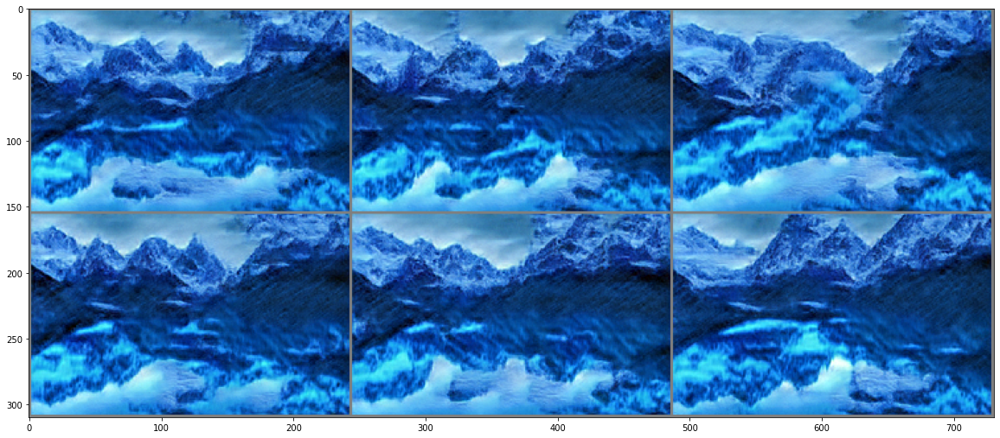

In [ ]:
x = netG_chain.sample(n_sample=6)
plt.figure(figsize=(20,10))
show_tensor_image(x,3)

In [ ]:
move_singan(netG_chain, torch.device('cpu'))
save_singan(netG_chain,'/content/singan_ice.pth')

## Water

In [ ]:
singan = SinGAN(0.75,device=cuda)
netD_list = []

In [ ]:
num_scales = len(scaled_img_list)
num_channel = 8

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,num_channel,num_channel,num_channel,3],[3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,num_channel,num_channel,num_channel,1],[3,3,3,3])
  # netD = Discriminator(img.size(),[3,num_channel,num_channel,num_channel,1],\
  #                      [4,4,4,7],[1,1,1,1],n_dense_layer=0)
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        singan,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=10,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  singan.append(netG,z_std,fixed_z)

  num_channel = (int) (num_channel / 0.75)
  

Output hidden; open in https://colab.research.google.com to view.

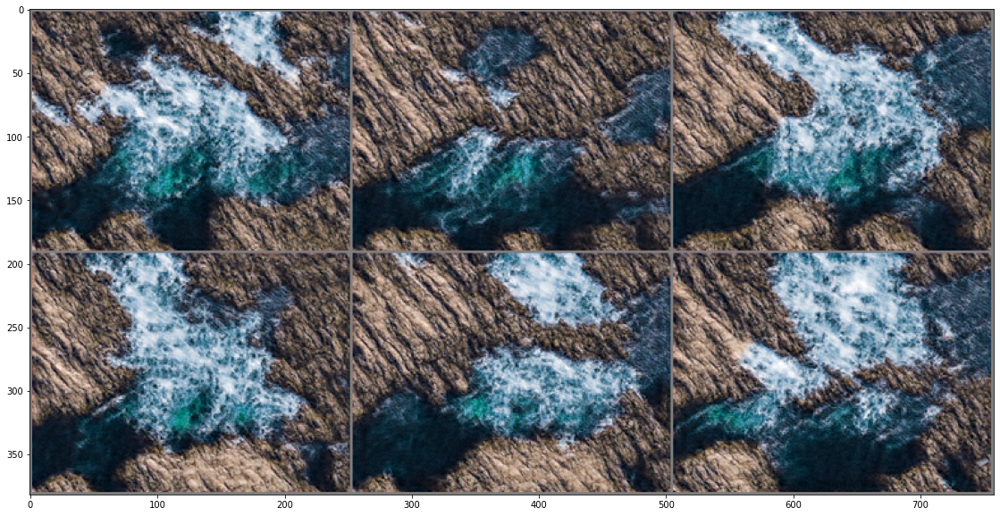

In [ ]:
x = singan.sample(n_sample=6)
plt.figure(figsize=(20,10))
show_tensor_image(x,3)

In [ ]:
cpu = torch.device('cpu')
singan.to(cpu)
save_singan(singan,'/content/singan_water.pth')

## Ocean

In [ ]:
singan = SinGAN(0.75,device=cuda)
netD_list = []

In [ ]:
num_scales = len(scaled_img_list)
num_channel = 8

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,num_channel,num_channel,num_channel,3],[3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,num_channel,num_channel,num_channel,1],[3,3,3,3])
  # netD = Discriminator(img.size(),[3,num_channel,num_channel,num_channel,1],\
  #                      [4,4,4,7],[1,1,1,1],n_dense_layer=0)
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        singan,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=10,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  singan.append(netG,z_std,fixed_z)

  num_channel = (int) (num_channel / 0.75)

Output hidden; open in https://colab.research.google.com to view.

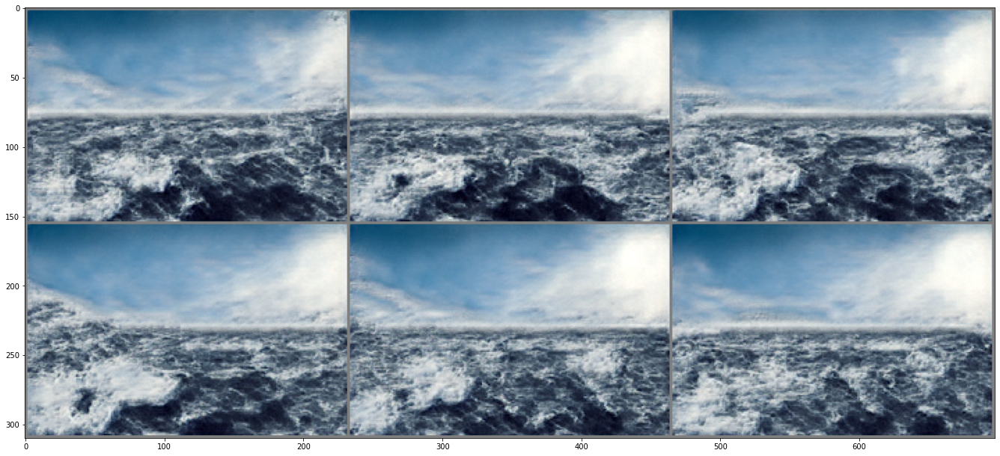

In [ ]:
x = singan.sample(n_sample=6)
plt.figure(figsize=(20,10))
show_tensor_image(x,3)

In [ ]:
cpu = torch.device('cpu')
singan.to(cpu)
save_singan(singan,'/content/singan_ocean.pth')

## Another Mountain

In [50]:
singan = SinGAN(0.75,device=cuda)
netD_list = []

In [51]:
num_scales = len(scaled_img_list)
nc = 8

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,nc,nc,nc,3],[3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,nc,nc,nc,1],[3,3,3,3])
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        singan,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=10,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  singan.append(netG,z_std,fixed_z)

  nc = (int) (nc / 0.75)

Output hidden; open in https://colab.research.google.com to view.

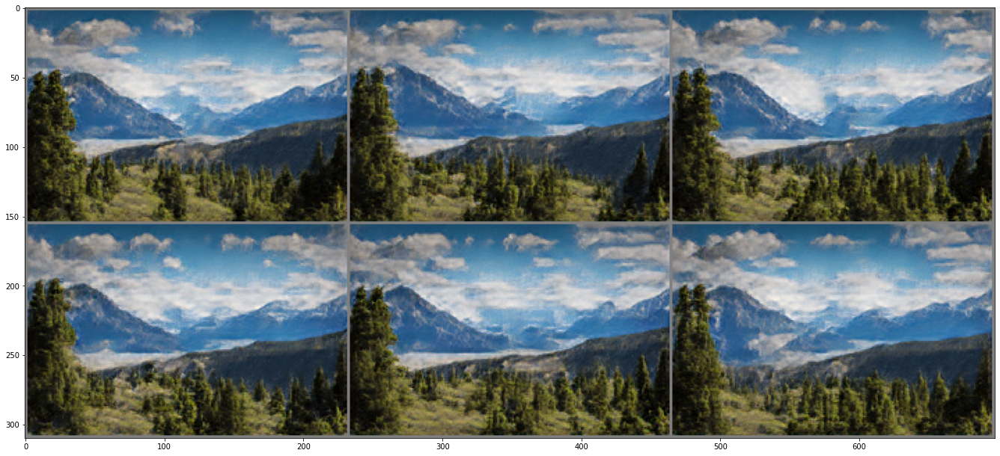

In [52]:
x = singan.sample(n_sample=6)
plt.figure(figsize=(20,10))
show_tensor_image(x,3)

In [53]:
cpu = torch.device('cpu')
singan.to(cpu)
save_singan(singan,'/content/singan_vs.pth')

## Everywhere

In [56]:
singan = SinGAN(0.75,device=cuda)
netD_list = []

In [57]:
num_scales = len(scaled_img_list)
nc = 12

for i in range(num_scales):

  img = scaled_img_tensor_list[i]
  netG = AddSkipGenerator([3,nc,nc,nc,nc,3],[3,3,3,3,3])
  netG = netG.to(cuda)
  netG.apply(xavier_uniform_weight_init)
  netD = ConvCritic([3,nc,nc,nc,nc,1],[3,3,3,3,3])
  # netD = Discriminator(img.size(),[3,num_channel,num_channel,num_channel,1],\
  #                      [4,4,4,7],[1,1,1,1],n_dense_layer=0)
  netD = netD.to(cuda)
  netD.apply(xavier_uniform_weight_init)
  netG_optim = torch.optim.Adam(netG.parameters(),lr=5e-4,betas=(0.5,0.999))
  netD_optim = torch.optim.Adam(netD.parameters(),lr=5e-4,betas=(0.5,0.999))
  netG_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netG_optim,milestones=[1600],gamma=0.1)
  netD_lrscheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=netD_optim,milestones=[1600],gamma=0.1)

  print("Scale {}".format(i+1))

  z_std, fixed_z, _ = train_singan_onescale(img, \
                        netG,netG_optim, \
                        netD,netD_optim, \
                        singan,2000, \
                        mode='wgangp', \
                        netG_lrscheduler=netG_lrscheduler, netD_lrscheduler=netD_lrscheduler, \
                        use_zero=True,batch_size=1, \
                        recloss_fun=None,recloss_scale=100,gp_scale=0.1,clip_range=0.01, \
                        z_std_scale=0.1, \
                        netG_iter=3,netD_iter=3, \
                        log_freq=200, plot_freq=200, figsize=(15,15))
  netD.eval()
  disable_grad(netD)
  netD_list.append(netD)
  netG.eval()
  disable_grad(netG)
  singan.append(netG,z_std,fixed_z)

  num_channel = (int) (num_channel / 0.75)

Output hidden; open in https://colab.research.google.com to view.

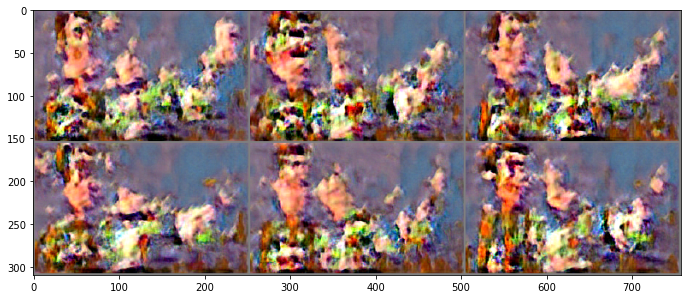

In [58]:
x = singan.sample(n_sample=6)
plt.figure(figsize=(10,8))
show_tensor_image(x,3)

In [62]:
x = scaled_img_tensor_list[-1]

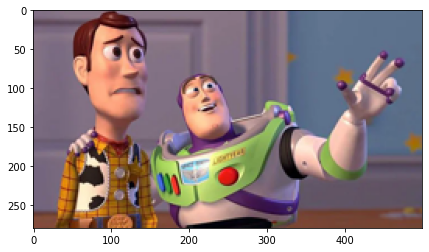

In [79]:
show_tensor_image(upsample(x,2))

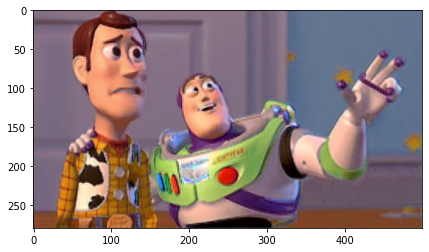

In [80]:
y = singan.inject(upsample(x,2),-1)
show_tensor_image(y)

In [81]:
save_tensor_image(x,"a.png")
save_tensor_image(y,"b.png")

In [47]:
cpu = torch.device('cpu')
singan.to(cpu)
save_singan(singan,'/content/singan_ew2.pth')

In [43]:
scaled_img_tensor_list[1].size()

torch.Size([1, 3, 15, 26])